In [1]:
import scanpy as sc
import muon as mu
import pandas as pd
import numpy as np
from scipy.stats import spearmanr
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

# Set random seed for reproducibility
SEED = 42
np.random.seed(SEED)
import random
random.seed(SEED)

/ihome/ylee/yiz133/.local/lib/python3.11/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound
/ihome/ylee/yiz133/.conda/envs/TCR_custom/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2026-03-12 12:55:25.997844: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2026-03-12 12:55:26.042441: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors fro

In [2]:
path = '/ix1/ylee/Yifan_Zhang/CellRanger_tests/E4S_cxcr4/outs/'

# Gene analysis

In [3]:
adata_ori = sc.read_10x_h5(path+'filtered_feature_bc_matrix.h5', gex_only=False)
adata_ori.var_names_make_unique()

# Split the AnnData object into Gene Expression and Antibody Capture
adata_ge = adata_ori[:, adata_ori.var['feature_types'] == 'Gene Expression'].copy()
adata_sbc = adata_ori[:, adata_ori.var['feature_types'] == 'Antibody Capture'].copy()

In [4]:
adata = adata_ge.copy()
adata

AnnData object with n_obs × n_vars = 6764 × 33696
    var: 'gene_ids', 'feature_types', 'genome', 'pattern', 'read', 'sequence'

In [5]:
adata.var['gene_ids']

Xkr4                  ENSMUSG00000051951
Gm1992                ENSMUSG00000089699
Gm19938               ENSMUSG00000102331
Gm37381               ENSMUSG00000102343
Rp1                   ENSMUSG00000025900
                             ...        
ENSMUSG00000095523    ENSMUSG00000095523
ENSMUSG00000095475    ENSMUSG00000095475
ENSMUSG00000094855    ENSMUSG00000094855
ENSMUSG00000095019    ENSMUSG00000095019
ENSMUSG00000095041    ENSMUSG00000095041
Name: gene_ids, Length: 33696, dtype: object

In [6]:
adata.var['mt'] = adata.var_names.str.startswith('mt-')
sc.pp.calculate_qc_metrics(
    adata, 
    qc_vars=['mt'], 
    percent_top=None, 
    log1p=False, 
    inplace=True
)


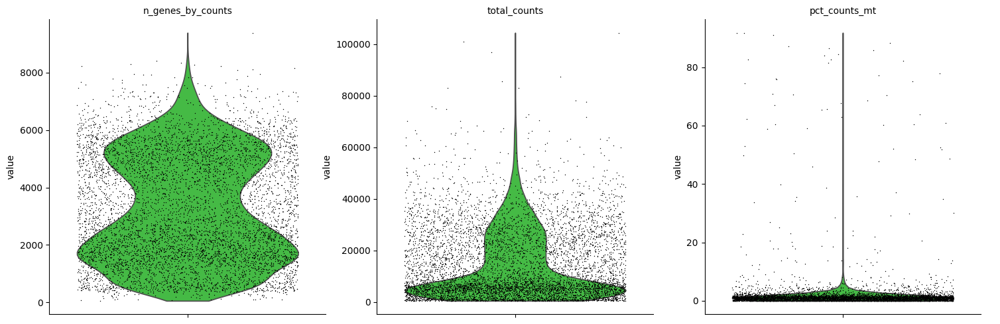

In [7]:
sc.pl.violin(
    adata,
    ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
    jitter=0.4,
    multi_panel=True,
    color='limegreen',
)

In [8]:
sc.pp.filter_cells(adata, min_genes= 300)
sc.pp.filter_cells(adata, max_genes= 8500)

sc.pp.filter_cells(adata, min_counts=1000)
sc.pp.filter_cells(adata, max_counts=70000)

sc.pp.filter_genes(adata, min_cells=50)

In [9]:
sc.pp.scrublet(adata)
adata = adata[adata.obs['predicted_doublet'] == False]

In [10]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata,  n_top_genes=2500, )

In [11]:
adata = adata[adata.obs['pct_counts_mt'] < 10]
adata = adata[:, adata.var['highly_variable']]

In [12]:
adata

View of AnnData object with n_obs × n_vars = 6319 × 2500
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'n_counts', 'doublet_score', 'predicted_doublet'
    var: 'gene_ids', 'feature_types', 'genome', 'pattern', 'read', 'sequence', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'scrublet', 'log1p', 'hvg'

In [13]:
def lR_to_l(adata, mapper={'leiden_R': 'leiden'}):
    for current_col_name in mapper:
        new_col_name = mapper[current_col_name]
        current_col = adata.obs[current_col_name].copy()
        adata.obs.drop(columns=current_col_name)
        adata.obs[new_col_name] = current_col
    return

def reset_colors(adata, key='leiden', use_plt=True):
    if use_plt:
        try:
            del(adata.uns['plt']['color'][key])
        except:
            pass
    else:
        try:
            del(adata.uns['%s_colors' % key])
        except:
            pass
    return

def relabel_clusts(adata, key='leiden'):
    try:
        adata.obs[key].cat
    except AttributeError:
        adata.obs[key] = adata.obs[key].astype('category')
        
    cats = adata.obs[key].cat.categories
    new_cats = [str(i) for i in range(len(cats))]
    adata.obs[key] = adata.obs[key].map(dict(zip(cats, new_cats)))
    adata.obs[key] = adata.obs[key].astype('category')
    
    reset_colors(adata, key=key)
    
    return

def clean_leiden(adata):
    lR_to_l(adata)
    relabel_clusts(adata)

In [14]:
sc.pp.pca(adata, svd_solver="arpack", n_comps=20, random_state=0)
sc.pp.neighbors(adata, n_neighbors=50, random_state=0)
sc.tl.umap(adata, min_dist=0.8, spread=0.8, random_state=0)

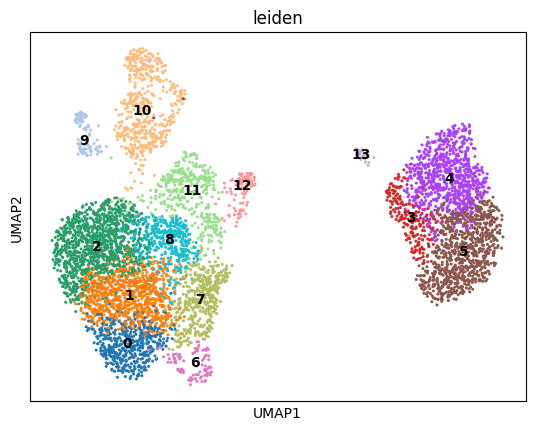

In [15]:
sc.tl.leiden(adata, resolution=0.6, n_iterations=-1, flavor='igraph', random_state=0)
sc.pl.umap(adata, color="leiden", legend_loc="on data")


In [16]:
# Run rank_genes_groups for each leiden cluster
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')

# Extract top 20 genes per cluster into a DataFrame
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
n_genes = 20

df_top_genes = pd.DataFrame({
    group: result['names'][group][:n_genes] for group in groups
})

# Also create a version with scores and pvals
df_detailed = pd.DataFrame()
for group in groups:
    temp_df = pd.DataFrame({
        'cluster': group,
        'gene': result['names'][group][:n_genes],
        'scores': result['scores'][group][:n_genes],
        'logfoldchanges': result['logfoldchanges'][group][:n_genes],
        'pvals': result['pvals'][group][:n_genes],
        'pvals_adj': result['pvals_adj'][group][:n_genes],
    })
    df_detailed = pd.concat([df_detailed, temp_df], ignore_index=True)



In [17]:
print(f"Top {n_genes} marker genes per cluster:")
df_top_genes.T
df_top_genes.to_csv("E4_top_marker_genes_per_cluster.csv")

Top 20 marker genes per cluster:


## Markers by HVGs

In [18]:
# By HVGs
# tsne clusters
# markers = {
#     "macrophage": ["Apoe", "Mertk", "Axl", "Cebpa", "Clec7a", "Myo1e"],
#     "neutrophil": ["S100a8", "S100a9", "Lcn2", "Cxcr2", "Cxcr3"],
#     "monocyte": ["Vcan", "Ly6c2", "Ccr2","Pid1", "Cd93"],
#     "dendritic_cell": ['Msr1', 'Itgax', 'Csf2ra', 'Cd14', 'Trpm2'],
#     "CD8_exhausted": [
#         "Cd3e", "Cd3g", "Cd28", "Lck", "Trbc1", "Trbc2",                    
#         "Tox", "Cxcr6", "Il2rb",               # exhaustion/tissue-resident
#     ],
#     "CD8_effector": ["Cd3e", "Cd3g", "Cd28", "Lck", "Trbc1", "Trbc2",  
#         "Nkg7", "Ctsw", "Klrg1", "Klrc1",     # cytotoxic effector
#     ],
#     'CD4+ T': ['Cd4'],
#     'Treg': ['Foxp3', 'Il2ra'],

#     "lymphatic_endothelial": [
#         "Prox1", "Ccl21a", "Ackr2", "Emcn", "Cldn5", "Sox7", "Plvap", ]   , 

#     "Malignant_epithelial": [
#         "Trp63", "Col17a1", "Itgb4",            # basal stem cell
#         "Krt6a", "Krt6b", "Krt90", "Krt17",             # keratins
#         "Dsg3", "Dsc3", "Cldn4",                # junctions
#         "Tmprss11b", "Tmprss11d", "Tmprss11g"]  # epithelial proteases
# 'Proliferating': ['Hsp90ab1', 'Npm1', 'Eif5a', 'Ptma']
# }

# UMAP clusters
markers = {
    'Macrophage': ['Mrc1', 'C1qa', 'Apoe', 'Mertk', 'Mafb', 'Dab2'],
    'T_cell': ['Lck', 'Cd2', 'Trac', 'Trbc2', 'Gimap3', 'Gimap4'],
    'Neutrophil': ['S100a8', 'S100a9', 'Cxcr2', 'Hdc', 'G0s2', 'Csf3r'],
    'Dendritic_cell': ['Flt3', 'Cd74', 'H2-Aa', 'Fcer1g', 'Ccr7'],
    'Monocyte': ['Ccr2', 'Vcan', 'Pid1', 'S100a4', 'Plac8'],
    'B_cell': ['Ighm', 'Blnk', 'Ly6d', 'Bcl11a', 'Cd37'],
    'Proliferate': ['Hsp90ab1', 'Npm1', 'Eif5a', 'Ptma'],
}

In [19]:
umap_params = {
    'legend_loc': "on data",
    's': 30,
    'add_outline': False,
    'ncols': 3,
    'frameon': False
}

In [20]:
# Score cells for each cell type using marker genes
for cell_type, genes in markers.items():
    # Filter to genes that exist in the dataset
    valid_genes = [g for g in genes if g in adata.var_names]
    if len(valid_genes) > 0:
        sc.tl.score_genes(adata, valid_genes, score_name=f'{cell_type}_score')
        print(f"{cell_type}: {len(valid_genes)}/{len(genes)} genes found")
    else:
        print(f"{cell_type}: No genes found in dataset")

Macrophage: 1/6 genes found
T_cell: 6/6 genes found
Neutrophil: 6/6 genes found
Dendritic_cell: 4/5 genes found
Monocyte: 5/5 genes found
B_cell: 4/5 genes found
Proliferate: No genes found in dataset


In [21]:
# Calculate mean score per leiden cluster for each cell type
score_cols = [col for col in adata.obs.columns if col.endswith('_score')]
cluster_scores = adata.obs.groupby('leiden')[score_cols].mean()

# Find the cell type with highest score for each cluster
cluster_annotations = cluster_scores.idxmax(axis=1).str.replace('_score', '')
cluster_annotations.name = 'cell_type_annotation'

# Map annotations to cells
adata.obs['cell_type'] = adata.obs['leiden'].map(cluster_annotations)


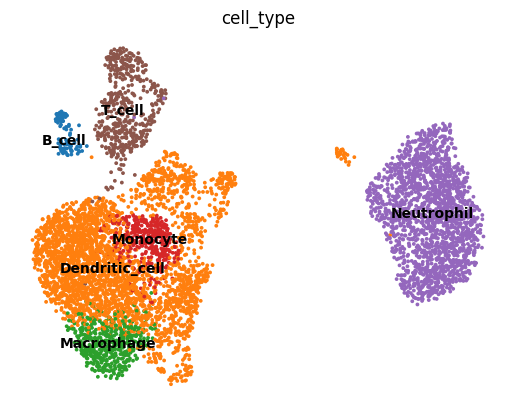

In [22]:
# Visualize the annotation on UMAP
sc.pl.umap(adata, color=['cell_type'], **umap_params)

In [23]:
# Add sum of SBC counts as an obs column (using intersecting index)
common_idx = adata.obs_names.intersection(adata_sbc.obs_names)
adata.obs.loc[common_idx, 'sbc_total_counts'] = (
    adata_sbc[common_idx].X.sum(axis=1).A1 
    if hasattr(adata_sbc.X, 'toarray')
    else adata_sbc[common_idx].X.sum(axis=1)
)
adata.obs['sbc_total_counts']
# Add the number of unique, nonzero barcode counts as 'num_bc'
adata.obs['num_bc'] = (adata_sbc[common_idx].X > 0).sum(axis=1).A1 if hasattr(adata_sbc.X, 'toarray') else (adata_sbc[common_idx].X > 0).sum(axis=1)

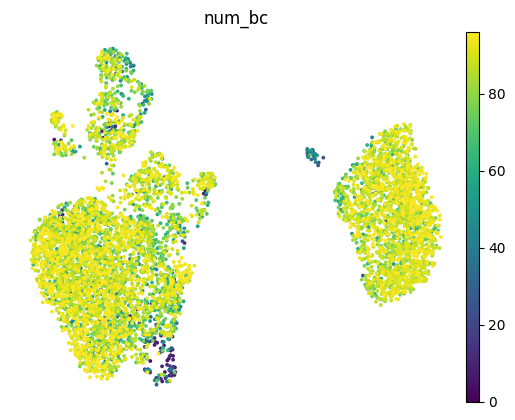

In [24]:
sc.pl.umap(adata, color=['num_bc'], vmin=0, vmax=96, **umap_params)

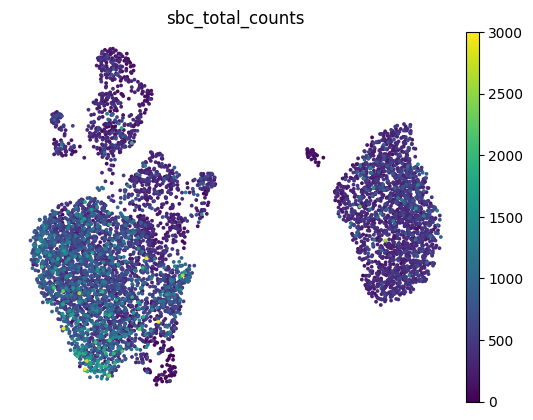

In [25]:
sc.pl.umap(adata, color=['sbc_total_counts'], vmin=0, vmax=3000, **umap_params)

## Canonical Markers for validation

In [26]:
# marker_dict_ref = {
#     'CD4+ T': ['Cd4'],
#     'CD8+ T': ['Cd8a','Cd8b1', 'Nkg7'],
#     'Treg': ['Foxp3', 'Il2ra'],
#     'NK': ['Ncam1', 'Nkg7', 'Gnly', 'Klrd1'],
#     'B': ['Cd19', 'Cd79a', 'Ms4a1', 'Cd79b'],
#     'Myeloid': ['Cd68', 'Itgam', 'Cd14', 'Cd33'],
#     'Monocyte': ['Cd14', 'Fcgr3a', 'Lyz'],
#     'Macrophage': ['Cd68', 'Cd163', 'Mrc1', 'Adgre1', 'Csf1r', 'Ly86'],
#     'DC': ['Fcer1a', 'Clec9a', 'Irf8'],
#     'Plasma': ['Ighg1', 'Ighg2', 'Jchain', 'Xbp1'],
#     'neutrophil':['S100a9', 'S100a8', 'Ifitm2']
# }


marker_dict_ref = {
    'Fibroblast': ['Col1a2'],
    'Macrophage': ['Cd68', 'Adgre1', 'Arg1', 'Mrc1',],
    'Neutrophil': ['S100a8', 'S100a9', 'Cxcr2'],
    'Monocyte': ['Cd74', 'H2-Eb1'],
    'Dendritic': ['H2-Ab1', 'Cd74'],

    'CD4+ T': ['Cd4'],
    'CD8+ T': ['Cd8a','Cd8b1', 'Nkg7'],
    'Treg': ['Foxp3', 'Il2ra'],
    'NK': ['Ncam1', 'Nkg7', 'Gnly', 'Klrd1'],
    'B': ['Cd19', 'Cd79a', 'Ms4a1', 'Cd79b'],
    
    'Endothelial': ['Cdh5', 'Pecam1'],
    'Epithelial': ['Epcam', 'Krt5'],

    "Malignant_epithelial": [
        "Trp63", "Col17a1", "Itgb4",            # basal stem cell
        "Krt6a", "Krt6b", "Krt90", "Krt17",             # keratins
        "Dsg3", "Dsc3", "Cldn4",                # junctions
        "Tmprss11b", "Tmprss11d", "Tmprss11g"],  # epithelial proteases

    'Proliferating': ['Hsp90ab1', 'Npm1', 'Eif5a', 'Ptma', 'Mki67', 'Top2a']
}

UMAP: Fibroblast (markers: ['Col1a2'])


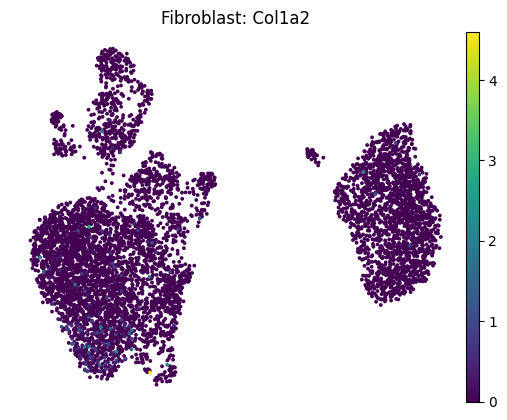

UMAP: Macrophage (markers: ['Arg1', 'Mrc1'])


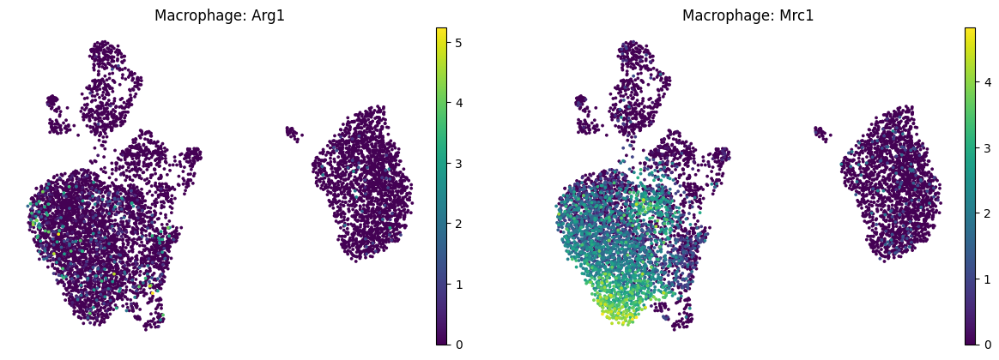

UMAP: Neutrophil (markers: ['S100a8', 'S100a9', 'Cxcr2'])


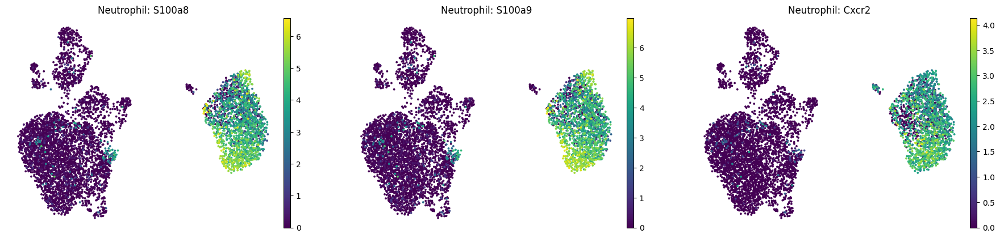

UMAP: Monocyte (markers: ['Cd74'])


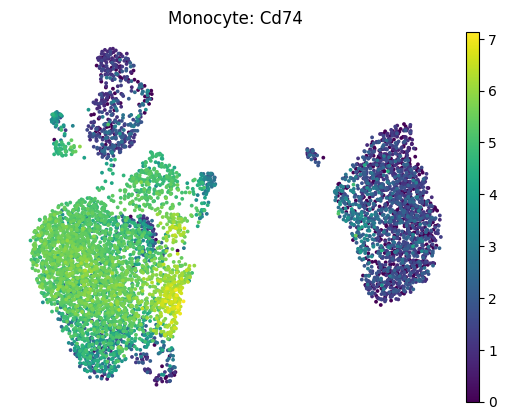

UMAP: Dendritic (markers: ['Cd74'])


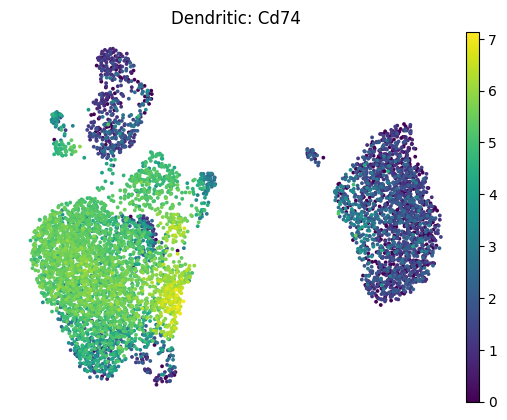

UMAP: CD4+ T (markers: ['Cd4'])


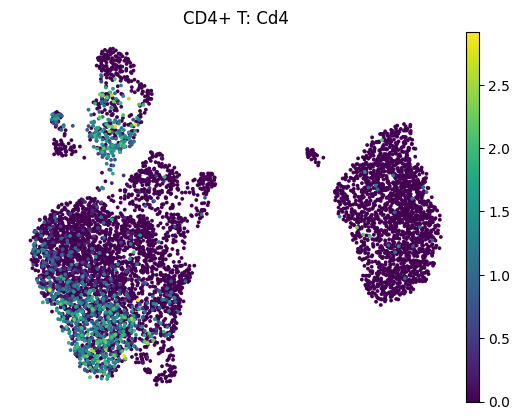

UMAP: CD8+ T (markers: ['Cd8a', 'Cd8b1', 'Nkg7'])


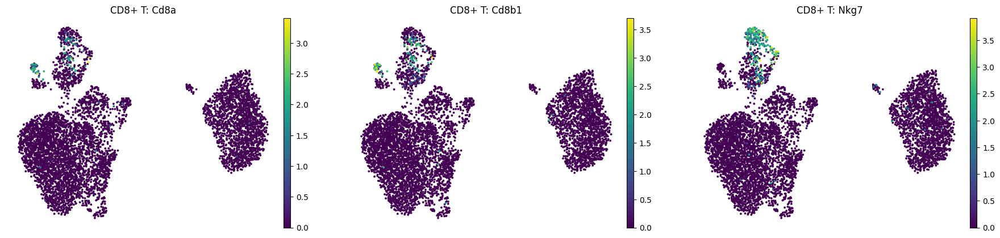

UMAP: Treg (markers: ['Foxp3', 'Il2ra'])


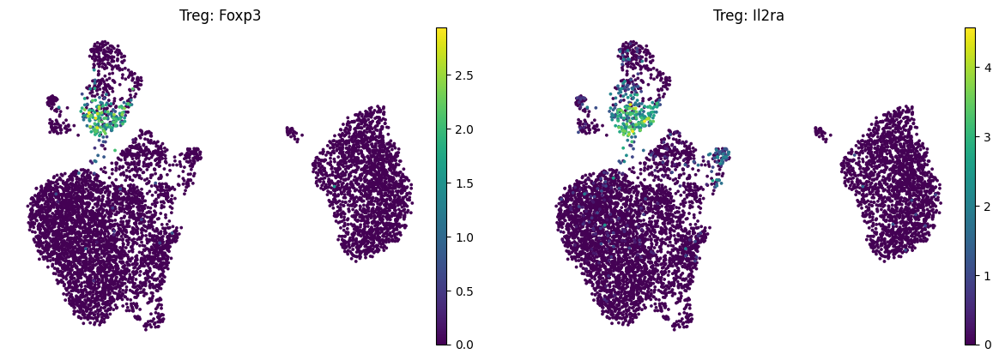

UMAP: NK (markers: ['Ncam1', 'Nkg7', 'Klrd1'])


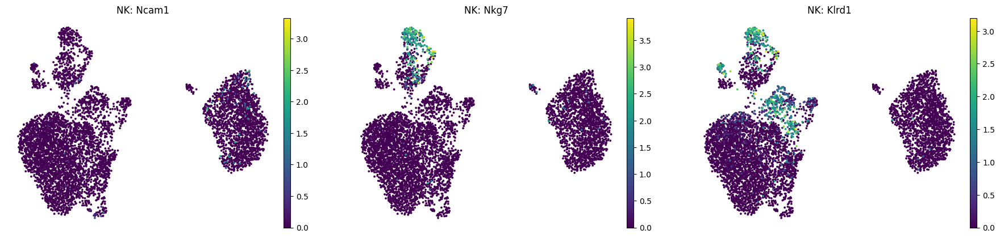

UMAP: B (markers: ['Cd79a', 'Ms4a1', 'Cd79b'])


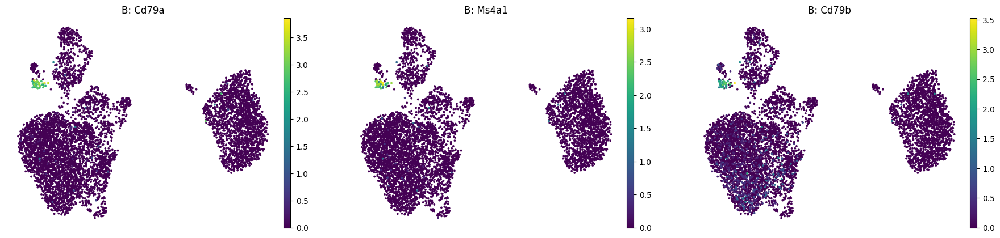

UMAP: Endothelial (markers: ['Cdh5'])


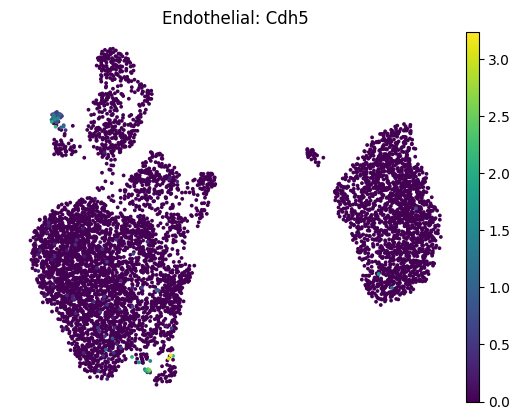

UMAP: Epithelial (markers: ['Epcam', 'Krt5'])


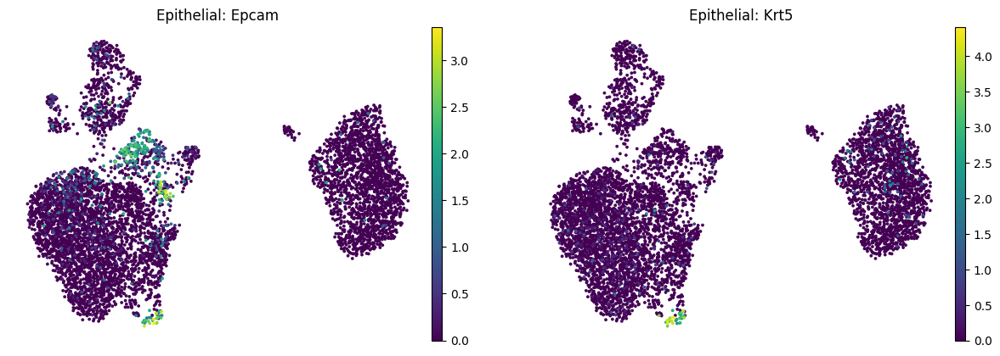

UMAP: Malignant_epithelial (markers: ['Trp63', 'Itgb4', 'Krt6a', 'Krt6b', 'Krt90', 'Krt17', 'Tmprss11d'])


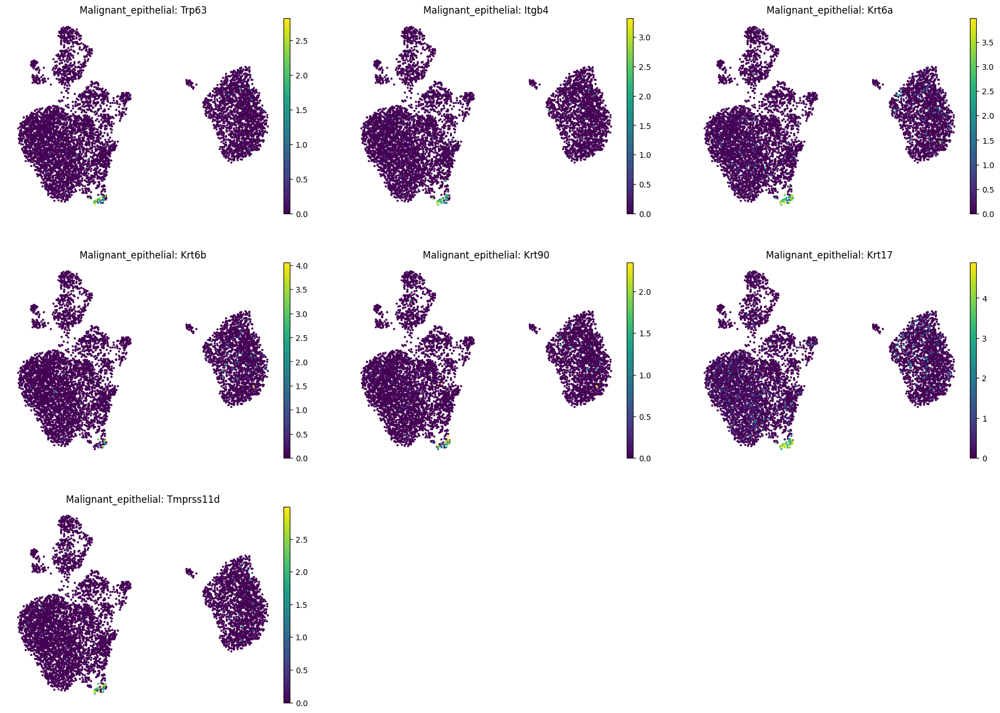

UMAP: Proliferating (markers: ['Mki67', 'Top2a'])


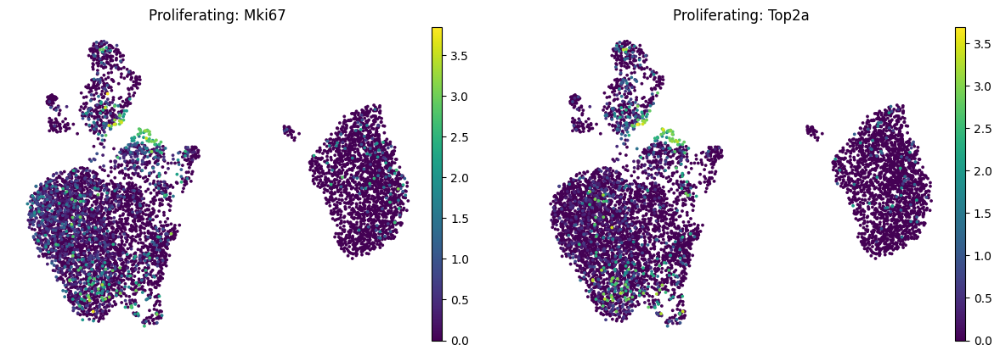

In [27]:
# Plot UMAP for each marker group in marker_dict_ref
for celltype, marker_list in marker_dict_ref.items():
    # Make sure markers exist in your adata.var_names (may want to filter missing ones)
    valid_markers = [gene for gene in marker_list if gene in adata.var_names]
    if not valid_markers:
        print(f"[Warning] No valid markers for {celltype}")
        continue
    print(f"UMAP: {celltype} (markers: {valid_markers})")
    sc.pl.umap(adata, color=valid_markers, title=[f"{celltype}: {gene}" for gene in valid_markers], **umap_params)

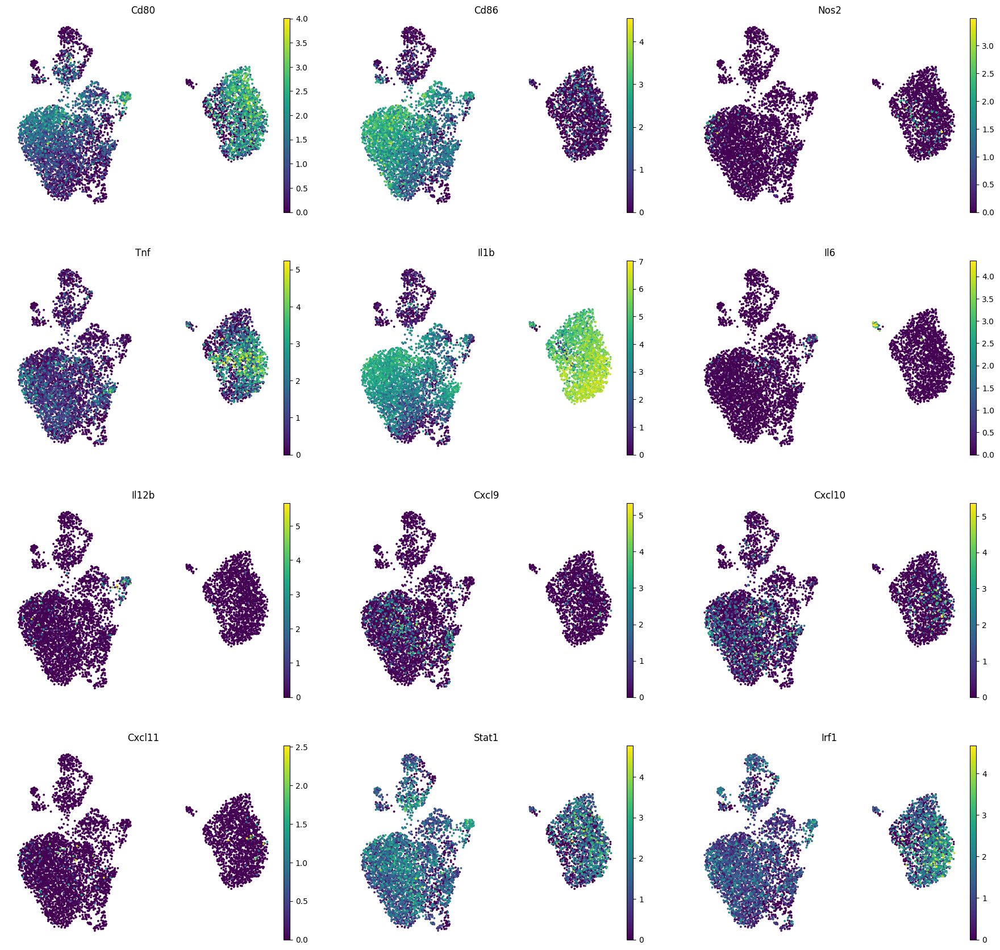

In [28]:
# M1 macrophage markers
gene_list = ['Cd80', 'Cd86', 'Nos2', 'Tnf', 'Il1b', 'Il6', 'Il12b',
      'Cxcl9',
      'Cxcl10',
      'Cxcl11',
      'Stat1',
      'Irf1',]

valid_gene_list = [gene for gene in gene_list if gene in adata.var_names]

sc.pl.umap(adata, color=valid_gene_list, **umap_params)



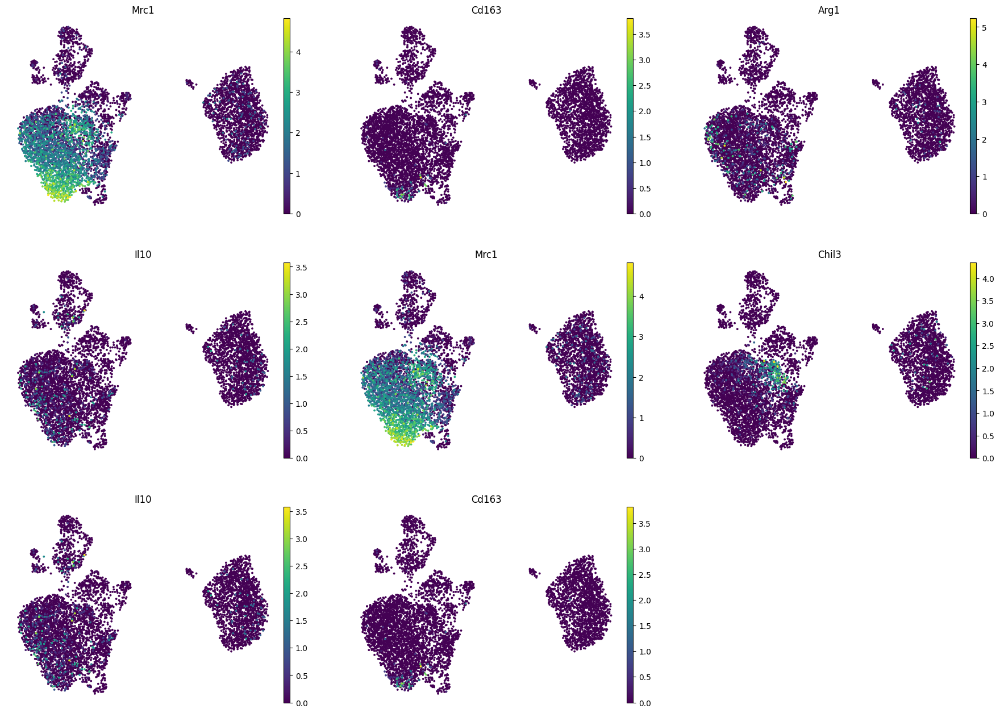

In [29]:
# M2 macrophage markers
gene_list = ['Mrc1', 'Cd163', 'Msr1', 'Arg1', 'Il10', 'Tgfb1',
      'Mrc1',
      'Retnla',
      'Chil3',
      'Il10',
      'Tgfb1',
      'Cd163',
      'Mertk']
valid_gene_list = [gene for gene in gene_list if gene in adata.var_names]
sc.pl.umap(adata, color=valid_gene_list, **umap_params)

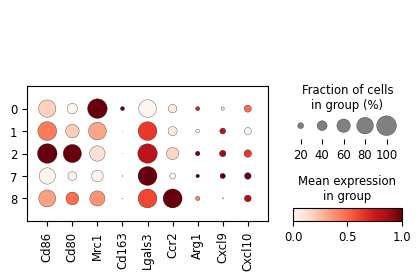

In [30]:
mac_list = ['Lamp2', 'Itgam', 'Cd86', 'Cd80', 'Mrc1', 'Cd163', 
'Adgre1', 'Lgals3', 'Cd68', 'Itgax', 'H2-Ab1', 'Csf1r', 'Ccr2', 'Arg1',
      'Cxcl9',
      'Cxcl10',]
genes_to_plot = list(gene for gene in mac_list if gene in adata.var_names)

selected_leiden = ['0','1','2','7','8']
adata_subset = adata[adata.obs['leiden'].isin(selected_leiden)]

sc.pl.dotplot(
    adata_subset,
    var_names=genes_to_plot,
    groupby="leiden",
    standard_scale='var',
    show=True
)

UMAP: pan_DC (markers: ['H2-Aa', 'Flt3', 'Zbtb46'])


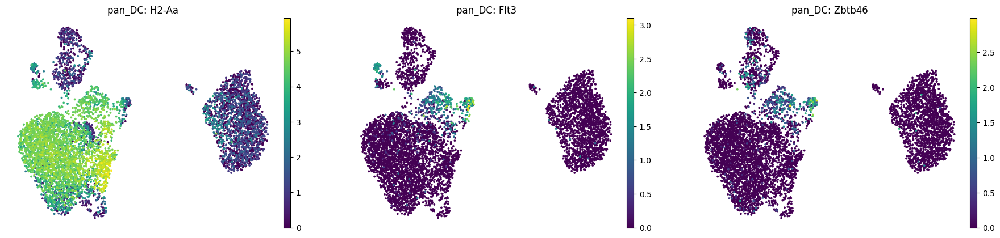

UMAP: cDC1 (markers: ['Xcr1', 'Clec9a', 'Cadm1'])


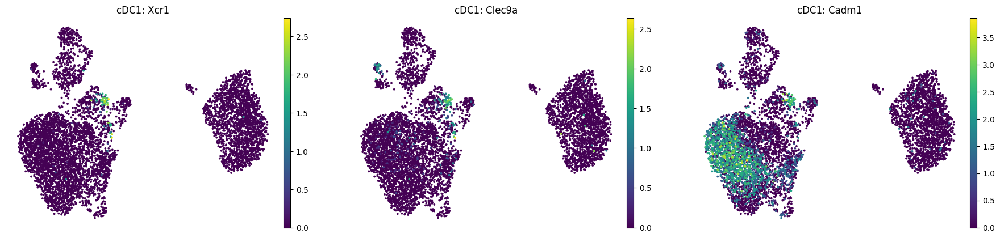

UMAP: cDC2 (markers: ['Clec12a', 'Clec10a', 'Irf4'])


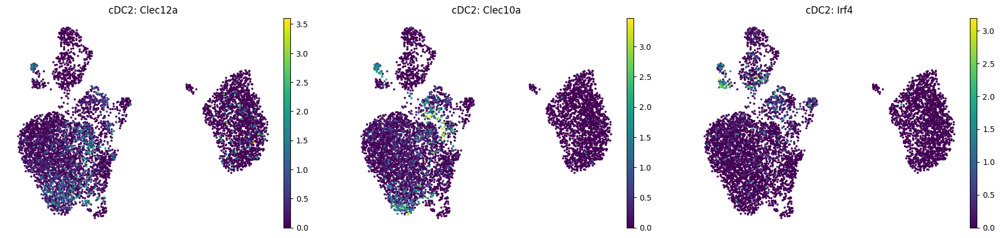

UMAP: pDC (markers: ['Siglech', 'Bst2', 'Ly6d', 'Ccr9', 'Irf7', 'Tcf4'])


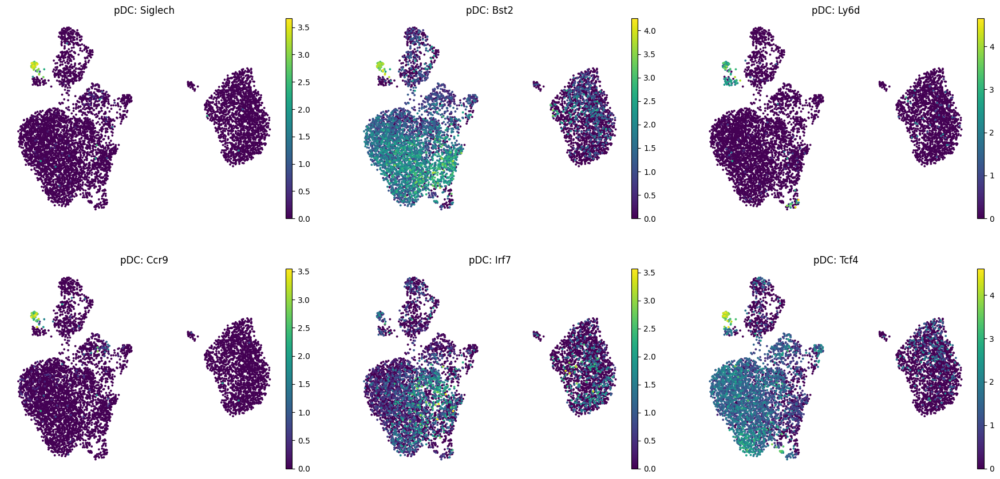

UMAP: migratory_DC (markers: ['Ccr7', 'Fscn1', 'Cacnb3', 'Nudt17'])


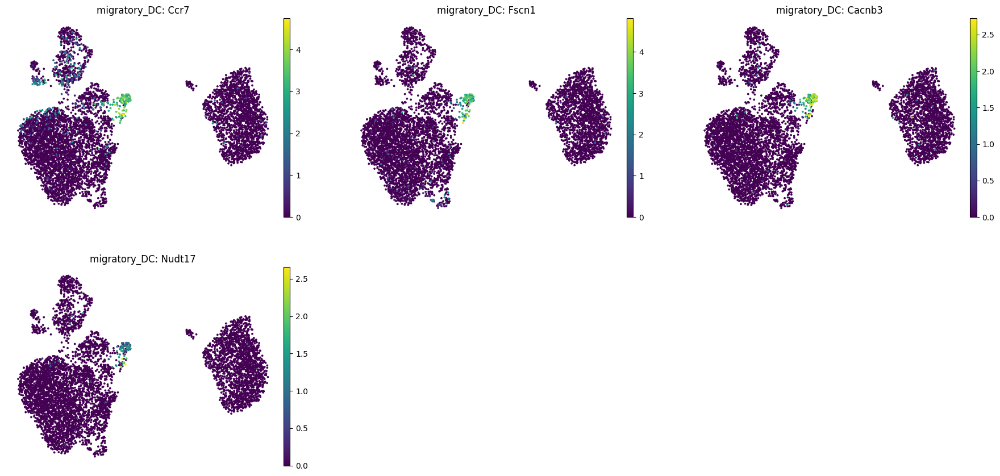

In [31]:
# Dendritic Cell and Monocyte Marker Genes (Mouse)
# For use with sc.tl.score_genes or manual cluster annotation

dc_markers = {
    "pan_DC": ["Itgax", "H2-Aa", "H2-Ab1", "Flt3", "Zbtb46"],

    "cDC1": ["Xcr1", "Clec9a", "Cadm1", "Irf8", "Batf3", "Tlr3"],

    "cDC2": ["Clec12a", "Clec10a", "Sirpa", "Cx3cr1", "Irf4", "Notch2"],

    "pDC": ["Siglech", "Bst2", "Ly6d", "Ccr9", "Irf7", "Tcf4"],

    "migratory_DC": ["Ccr7", "Fscn1", "Cacnb3", "Nudt17"],
}
# Plot UMAP for each marker group in marker_dict_ref
for celltype, marker_list in dc_markers.items():
    # Make sure markers exist in your adata.var_names (may want to filter missing ones)
    valid_markers = [gene for gene in marker_list if gene in adata.var_names]
    if not valid_markers:
        print(f"[Warning] No valid markers for {celltype}")
        continue
    print(f"UMAP: {celltype} (markers: {valid_markers})")
    sc.pl.umap(adata, color=valid_markers, title=[f"{celltype}: {gene}" for gene in valid_markers], **umap_params)


UMAP: pan_monocyte (markers: ['Cd14'])


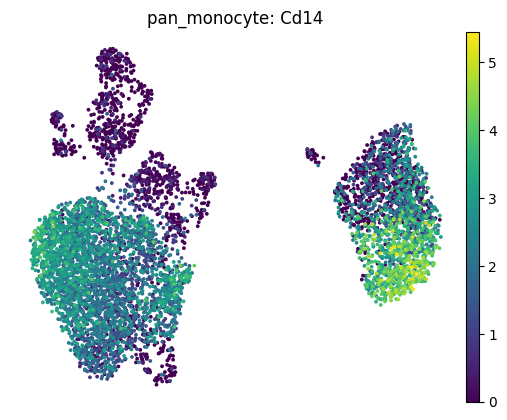

UMAP: classical_monocyte (markers: ['Ly6c2', 'Ccr2', 'Sell', 'S100a8', 'S100a9', 'Chil3'])


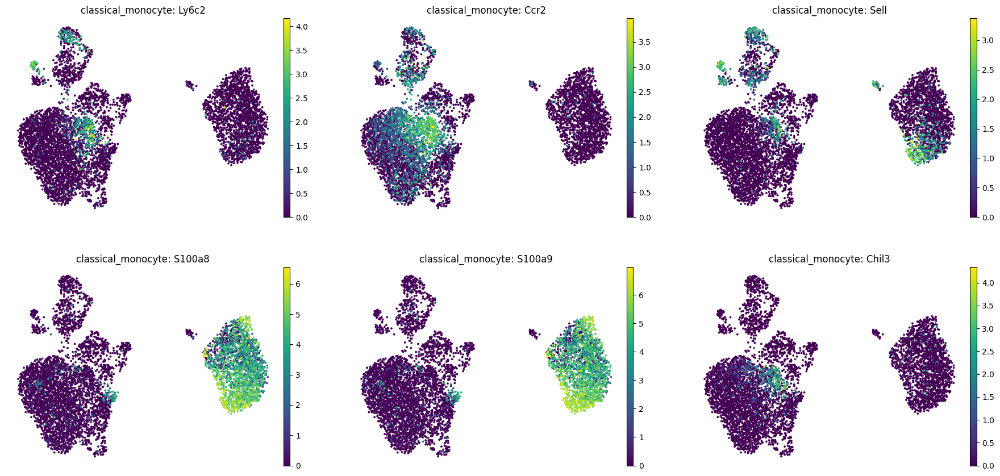

UMAP: nonclassical_monocyte (markers: ['Treml4'])


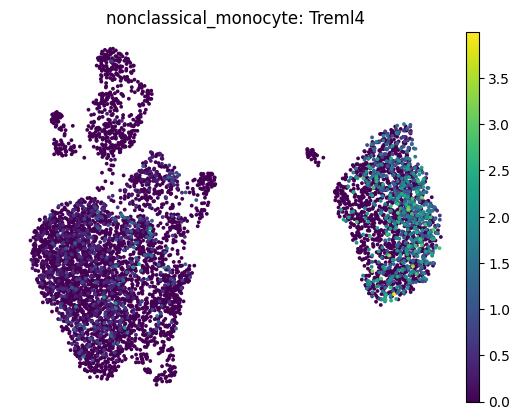

UMAP: intermediate_monocyte (markers: ['Cd14'])


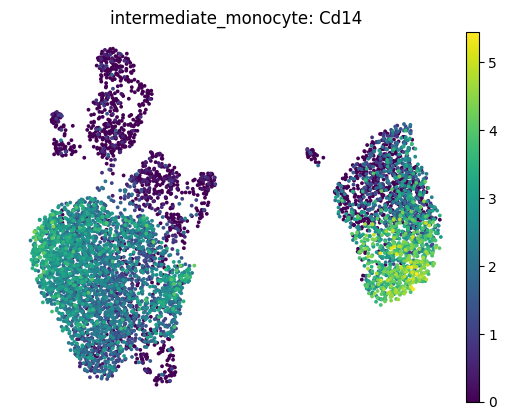

In [32]:
monocyte_markers = {
    "pan_monocyte": ["Cd14", "Lyz2", "Csf1r", "Fcgr3"],

    "classical_monocyte": ["Ly6c2", "Ccr2", "Sell", "S100a8", "S100a9", "Chil3"],

    "nonclassical_monocyte": ["Cx3cr1", "Nr4a1", "Spn", "Ace", "Treml4"],

    "intermediate_monocyte": ["Cd14", "Fcgr3", "Cx3cr1"],
}

# Plot UMAP for each marker group in marker_dict_ref
for celltype, marker_list in monocyte_markers.items():
    # Make sure markers exist in your adata.var_names (may want to filter missing ones)
    valid_markers = [gene for gene in marker_list if gene in adata.var_names]
    if not valid_markers:
        print(f"[Warning] No valid markers for {celltype}")
        continue
    print(f"UMAP: {celltype} (markers: {valid_markers})")
    sc.pl.umap(adata, color=valid_markers, title=[f"{celltype}: {gene}" for gene in valid_markers], **umap_params)

UMAP: Mature_Neut (markers: ['S100a8', 'S100a9', 'Cxcr2'])


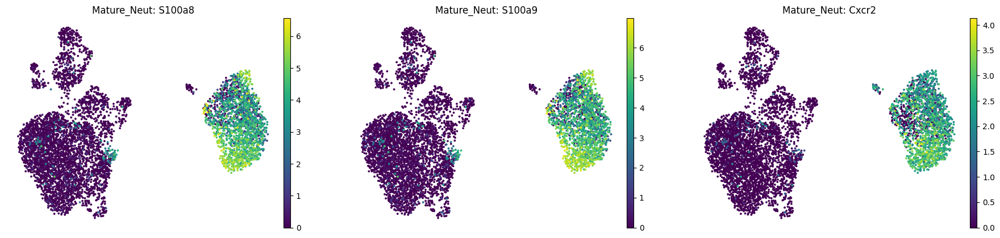

UMAP: N1_N2 (markers: ['Arg2', 'Ccl3', 'Olr1', 'Nos2', 'Tnf'])


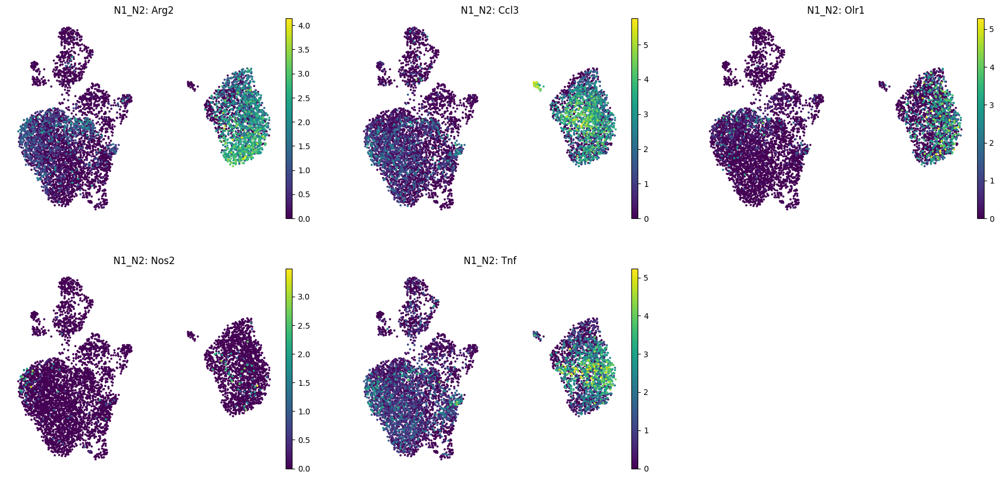

In [33]:
# 'Neutrophil': ['S100a8', 'S100a9', 'Cxcr2'],
neutrophil_markers = {
    'Mature_Neut': ['S100a8', 'S100a9', 'Cxcr2'],
    'N1_N2' :['Arg2', 'Ccl3', 'Olr1', 'Nos2','Tnf'],
}

# Plot UMAP for each marker group in marker_dict_ref
for celltype, marker_list in neutrophil_markers.items():
    # Make sure markers exist in your adata.var_names (may want to filter missing ones)
    valid_markers = [gene for gene in marker_list if gene in adata.var_names]
    if not valid_markers:
        print(f"[Warning] No valid markers for {celltype}")
        continue
    print(f"UMAP: {celltype} (markers: {valid_markers})")
    sc.pl.umap(adata, color=valid_markers, title=[f"{celltype}: {gene}" for gene in valid_markers], **umap_params)

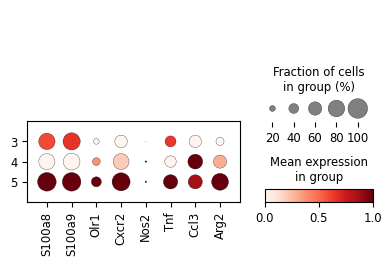

In [34]:
# DotPlot for genes in neutrophil_markers by leiden cluster 3, 4, 5

# Get all unique genes in neutrophil_markers
genes_to_plot = list({gene for sublist in neutrophil_markers.values() for gene in sublist if gene in adata.var_names})

# Select cells belonging to leiden clusters 3, 4, 5
selected_leiden = ['3', '4', '5']
adata_subset = adata[adata.obs['leiden'].isin(selected_leiden)]

sc.pl.dotplot(
    adata_subset,
    var_names=genes_to_plot,
    groupby="leiden",
    standard_scale='var',
    show=True
)

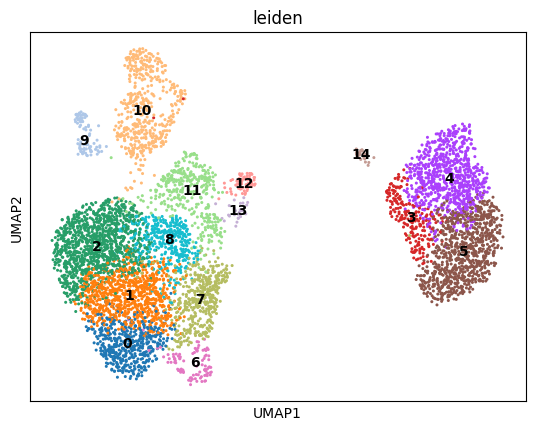

In [35]:
# split leiden cluster
# run if needs

sc.tl.leiden(adata, resolution=0.2, restrict_to=('leiden', ['12']), flavor="igraph", random_state=42)
clean_leiden(adata)
sc.pl.umap(adata, color="leiden", legend_loc="on data")

In [36]:
# Find differentially expressed genes for Leiden groups 14 and 10 vs the rest
sc.tl.rank_genes_groups(
    adata, 
    groupby="leiden", 
    groups=['13'], 
    reference="rest", 
    method="wilcoxon"
)
# Save the top ranked genes in a DataFrame
import pandas as pd

result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names if hasattr(result['names'], 'dtype') and hasattr(result['names'], 'shape') else result['names'].keys()
# n_genes is the number of top genes to save
n_genes = 25
top_genes_dict = {}
for group in groups:
    top_genes_dict[group] = pd.DataFrame({
        'names': result['names'][group][:n_genes],
        'scores': result['scores'][group][:n_genes],
    })
    
top_genes_dict[group]

,names,scores
0,Crip1,9.181867
1,Lsp1,8.975266
2,Ccr7,8.867323
3,Tbc1d4,8.825492
4,Fscn1,8.560022
5,Tmem123,8.462741
6,Ramp3,7.647100
7,Tmsb10,7.447896
8,Ccl5,7.418972
9,Serpinb6b,7.391935


KeyError: 'Could not find key cluster_annotation in .var_names or .obs.columns.'

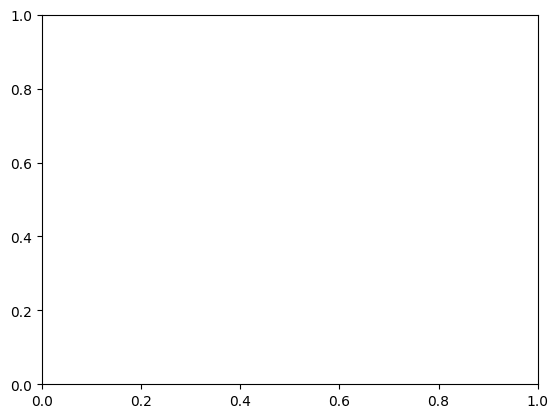

In [39]:
sc.pl.umap(adata, color='cluster_annotation')

In [ ]:
# Assign preliminary cluster annotation based on mapping
adata.obs['cluster_annotation'] = adata.obs['cell_type']

cluster_annotation = {
    0: "M2 Mac",
    1: "Macrophage",
    2: "M1 Mac",
    7: "DC",
    8: "Monocyte",

    3: "Neutrophil",
    4: "N2",
    5: "N1",
    6: "Cancer cell",

    11:"CD8+ T",
    12:"Treg",
    13:"CD4+ T",

    9:"B",
    14:"Epithelial",
    15:"Epithelial",
    10:"pDC",
    16:"mDC",
    17:"imflam Mac"
    
}


In [ ]:
# Add cluster annotation to adata.obs
# For clusters in cluster_annotation, use the mapping; otherwise keep cell_type
adata.obs['cluster_annotation'] = adata.obs.apply(
    lambda row: cluster_annotation.get(int(row['leiden']), row['cell_type']), 
    axis=1
)

# Plot the cluster annotation on UMAP
sc.pl.umap(adata, color='cluster_annotation', legend_loc='on data', title='Cluster Annotation', legend_fontsize=10)

In [ ]:
adata.obs['cluster_annotation'].value_counts()

In [ ]:
cluster_pct = adata.obs['cluster_annotation'].value_counts(normalize=True) * 100
cluster_pct_df = cluster_pct.reset_index()
cluster_pct_df.columns = ['cluster_annotation', 'percentage']
cluster_pct_df['percentage'] = cluster_pct_df['percentage'].round(2)
cluster_pct_df

In [ ]:
# adata.write("E4S_cluster_annotated.h5ad")
# aa

In [ ]:
# adata = sc.read("E4S_cluster_annotated.h5ad")

# Annotate tumor by infercnv

In [ ]:
import io

# 1. Load the GTF file (The "Local Replacement")
# Replace with the actual path to your GRCm38 genes.gtf
gtf_path = "/ix1/ylee/Yifan_Zhang/Cellranger_ref/refdata-gex-GRCm39-2024-A/genes_gtf/genes.gtf"

# Define the columns for a standard GTF
cols = ["chr", "source", "feature", "start", "end", "score", "strand", "frame", "attribute"]

# Read the file, skipping the header lines (starting with #)
gtf_df = pd.read_csv(gtf_path, sep="\t", comment="#", names=cols, low_memory=False)

# 2. Filter for 'gene' entries to get the boundaries
gtf_genes = gtf_df[gtf_df["feature"] == "gene"].copy()

# 3. Extract the Gene Symbol from the 'attribute' column 
# (This regex looks for 'gene_name "Symbol";')
gtf_genes["gene_symbol"] = gtf_genes["attribute"].str.extract('gene_name "([^"]+)"')

# 4. Create the mapping table
mapping_table = gtf_genes[["gene_symbol", "chr", "start", "end"]].dropna().drop_duplicates("gene_symbol")
mapping_table.set_index("gene_symbol", inplace=True)

# 5. Inject into your AnnData for infercnvpy
adata.var['chromosome'] = adata.var_names.map(mapping_table['chr'])
adata.var['start'] = adata.var_names.map(mapping_table['start'])
adata.var['end'] = adata.var_names.map(mapping_table['end'])

# 6. Cleanup (Remove genes that didn't find a match in the GTF)
adata = adata[:, adata.var['chromosome'].notna()].copy()

In [ ]:
adata.var.loc[:, ["gene_ids", "chromosome", "start", "end"]].head()

In [ ]:
adata.obs['cell_type'].cat.categories.tolist()

In [ ]:
import infercnvpy as cnv
# We provide all immune cell types as "normal cells".
cnv.tl.infercnv(
    adata,
    reference_key="cell_type",
    window_size=250,
    # reference_cat=adata.obs['cluster_annotation'].cat.categories.tolist(),
    reference_cat=['B_cell',
                    'T_cell',
                    'Macrophage',
                    'Neutrophil',
                  'Monocyte']
)

In [ ]:
cnv.pl.chromosome_heatmap(adata, groupby="cluster_annotation")

In [ ]:
cnv.tl.pca(adata, n_comps=5)
cnv.pp.neighbors(adata)
cnv.tl.leiden(adata)

In [ ]:
cnv.pl.chromosome_heatmap(adata, groupby="cnv_leiden")

In [ ]:
cnv.tl.umap(adata)
cnv.tl.cnv_score(adata)

In [ ]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(11, 11))
ax4.axis("off")
cnv.pl.umap(
    adata,
    color="cnv_leiden",
    legend_loc="on data",
    legend_fontoutline=2,
    ax=ax1,
    show=False,
)
cnv.pl.umap(adata, color="cnv_score", ax=ax2, show=False)
cnv.pl.umap(adata, color="cell_type", ax=ax3)

In [ ]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 11), gridspec_kw={"wspace": 0.5})
ax4.axis("off")
sc.pl.umap(adata, color="cnv_leiden", ax=ax1, show=False)
sc.pl.umap(adata, color="cnv_score", ax=ax2, show=False)
sc.pl.umap(adata, color="cell_type", ax=ax3)

In [ ]:
adata.obs["cnv_status"] = "normal"
adata.obs.loc[adata.obs["cnv_leiden"].isin(["19", "6", '23']), "cnv_status"] = (
    "tumor"
)

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), gridspec_kw={"wspace": 0.5})
cnv.pl.umap(adata, color="cnv_status", ax=ax1, show=False)
sc.pl.umap(adata, color="cnv_status", ax=ax2)